In [79]:
# std
import json

# third party
import re
import dash 
import seaborn as sns
import folium
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import geopandas as gpd
import numpy as np
from dash import dcc, html
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from folium.plugins import HeatMap
from keplergl import KeplerGl

# project

In [2]:
# Load the data in 
df = pd.read_csv('data/trees.csv', low_memory=False)

In [3]:
# What does the data look like?
print("Data overview:")
display(df.head())  
display(df.info()) 

Data overview:


,objectid,borough,maintainer,gla_tree_name,tree_name,taxon_name,common_name,age,age_group,height_m,spread_m,canopy_spread_group,diameter_at_breast_height_cm,dbh_group,longitude,latitude,condition,load_date,updated
0,1,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Early mature (16-30),10 to 15m,NaN,00 to 05m,NaN,21 to 40cm,-0.291147,51.361893,Reasonable,20210318,20210715
1,2,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Early mature (16-30),10 to 15m,NaN,00 to 05m,NaN,21 to 40cm,-0.291122,51.361914,Reasonable,20210318,20210715
2,3,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Early mature (16-30),05 to 10m,NaN,05 to 10m,NaN,21 to 40cm,-0.290943,51.387016,Reasonable,20210318,20210715
3,4,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Mature (31-80),10 to 15m,NaN,05 to 10m,NaN,41 to 70cm,-0.288572,51.387405,Reasonable,20210318,20210715
4,5,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Mature (31-80),10 to 15m,NaN,05 to 10m,NaN,41 to 70cm,-0.285025,51.388872,Reasonable,20210318,20210715


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817150 entries, 0 to 817149
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   objectid                      817150 non-null  int64  
 1   borough                       817150 non-null  object 
 2   maintainer                    817150 non-null  object 
 3   gla_tree_name                 817150 non-null  object 
 4   tree_name                     815916 non-null  object 
 5   taxon_name                    766107 non-null  object 
 6   common_name                   682231 non-null  object 
 7   age                           211161 non-null  object 
 8   age_group                     229336 non-null  object 
 9   height_m                      103218 non-null  object 
 10  spread_m                      100408 non-null  float64
 11  canopy_spread_group           18175 non-null   object 
 12  diameter_at_breast_height_cm  208152 non-nul

None

In [4]:
## I want to see what the unique values in each column are so that I can better understand how to clean the data
for column in df.columns:
    print(f"Unique values in {column}:")
    print(df[column].unique())
    print("\n")

Unique values in objectid:
[     1      2      3 ... 817148 817149 817150]


Unique values in borough:
['Kingston upon Thames' 'Bromley' 'Ealing' 'Hammersmith and Fulham'
 'Harrow' 'Kensington and Chelsea' 'Merton' 'Hounslow' 'Richmond'
 'Westminster' 'Sutton' 'Bexley' 'Waltham Forest' 'Islington' 'Redbridge'
 'Hillingdon' 'Haringey' 'Lewisham' 'Croydon' 'Barnet' 'Havering' 'Newham'
 'Barking and Dagenham' 'Wandsworth' 'Enfield' 'Southwark' 'Brent'
 'Camden' 'Out' 'City' 'Lambeth' 'Hackney' 'Tower Hamlets' 'Greenwich']


Unique values in maintainer:
['Royal Borough of Kingston upon Thames' 'Bromley' 'Ealing'
 'Hammersmith and Fulham' 'Harrow' 'Kensington and Chelsea' 'Merton '
 'Hounslow' 'Richmond' 'Westminster' 'Sutton' 'Bexley' 'Waltham Forest'
 'Islington' 'LBBD Highways' 'LB Hillingdon' 'Private' 'LB Barnet'
 'TfL (Highways)' 'London Borough of Southwark' 'Recorder LB Redbridge'
 'LB Lewisham' 'LB Newham' 'LB Haringey' 'LB Greenwich' 'Enfield'
 'City of London' 'LB Lambeth' 'Londo

In [5]:
# This bit isn't very relevant to this project, this column will be dropped from the data set anyway 

# Let's start with cleaning the height_m column, so I've decided to keep them all as floats for consistency and change all the range's into their average 

# Function to clean height_m, take mid-point of ranges and convert single values to float
def clean_height(value):
    if isinstance(value, str):
        # If the value is in a range format like '10 to 15m', take the average
        match = re.findall(r'(\d+)', value)
        if len(match) == 2:
            return (float(match[0]) + float(match[1])) / 2  # Midpoint of the range
        elif len(match) == 1:
            return float(match[0])  # Single number
        else:
            return None
    return value

# Apply the function to 'height_m' and convert to numeric, leaving NaNs as they are
df['height_m'] = df['height_m'].apply(clean_height)
df['height_m'] = pd.to_numeric(df['height_m'], errors='coerce')

In [6]:
# Columns like 'height_m', 'spread_m', 'diameter_at_breast_height_cm' might need conversion to numeric

df_cleaned = df.copy()

# Convert columns to numeric, coercing errors to NaN for any non-convertible values
df_cleaned['height_m'] = pd.to_numeric(df_cleaned['height_m'], errors = 'coerce')
df_cleaned['spread_m'] = pd.to_numeric(df_cleaned['spread_m'], errors = 'coerce')
df_cleaned['diameter_at_breast_height_cm'] = pd.to_numeric(df_cleaned['diameter_at_breast_height_cm'], errors = 'coerce')

# Checking missing values in the dataset
print("\nMissing data in the dataset:")
print(df_cleaned.isnull().sum())

# We can see there are lots of missing values in columns like 'tree_name', 'height_m', etc.
# Ideally we'd drop these now


Missing data in the dataset:
objectid                             0
borough                              0
maintainer                           0
gla_tree_name                        0
tree_name                         1234
taxon_name                       51043
common_name                     134919
age                             605989
age_group                       587814
height_m                        713932
spread_m                        716742
canopy_spread_group             798975
diameter_at_breast_height_cm    608998
dbh_group                       798975
longitude                            0
latitude                             0
condition                       798975
load_date                            0
updated                              0
dtype: int64


In [7]:
# Just drop any columns with null values
df_cleaned = df.dropna(axis=1)


In [8]:
# Check if there's any other missing values left
print("\nMissing values check after first clean:")
print(df_cleaned.isnull().sum())


Missing values check after first clean:
objectid         0
borough          0
maintainer       0
gla_tree_name    0
longitude        0
latitude         0
load_date        0
updated          0
dtype: int64


In [9]:
# Double checking that we have a representation of all the boroughs 
print(df_cleaned['borough'].unique())

['Kingston upon Thames' 'Bromley' 'Ealing' 'Hammersmith and Fulham'
 'Harrow' 'Kensington and Chelsea' 'Merton' 'Hounslow' 'Richmond'
 'Westminster' 'Sutton' 'Bexley' 'Waltham Forest' 'Islington' 'Redbridge'
 'Hillingdon' 'Haringey' 'Lewisham' 'Croydon' 'Barnet' 'Havering' 'Newham'
 'Barking and Dagenham' 'Wandsworth' 'Enfield' 'Southwark' 'Brent'
 'Camden' 'Out' 'City' 'Lambeth' 'Hackney' 'Tower Hamlets' 'Greenwich']


In [10]:
# The dataset is too huge to try out visals on it so before that I want to create a small subset of it to try things out with 
sample_df = df_cleaned.sample(n = 10000, random_state = 42)

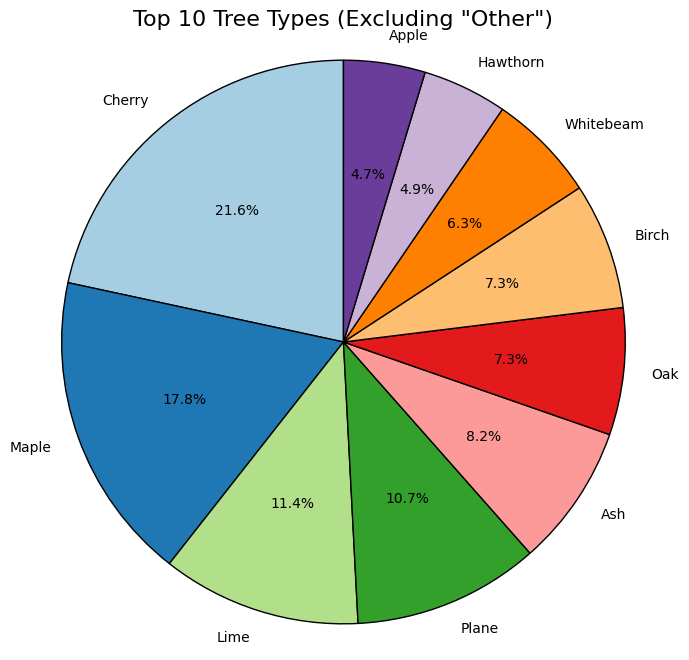

In [11]:
# Start off with some more basic visuals 
# Pie chart to show the number of different trees

tree_type_counts = df_cleaned[df_cleaned['gla_tree_name'] != 'Other']['gla_tree_name'].value_counts()

# Select the top 10 tree types
top_10_tree_types = tree_type_counts.head(10)

# Create a pie chart with percentages and customized visuals for the top 10 tree types
plt.figure(figsize=(8, 8))
plt.pie(top_10_tree_types, labels=top_10_tree_types.index, autopct='%1.1f%%', 
        startangle=90, colors=sns.color_palette("Paired", len(top_10_tree_types)), 
        wedgeprops={'edgecolor': 'black'})
plt.title('Top 10 Tree Types (Excluding "Other")', fontsize=16)
plt.axis('equal')  
plt.show()

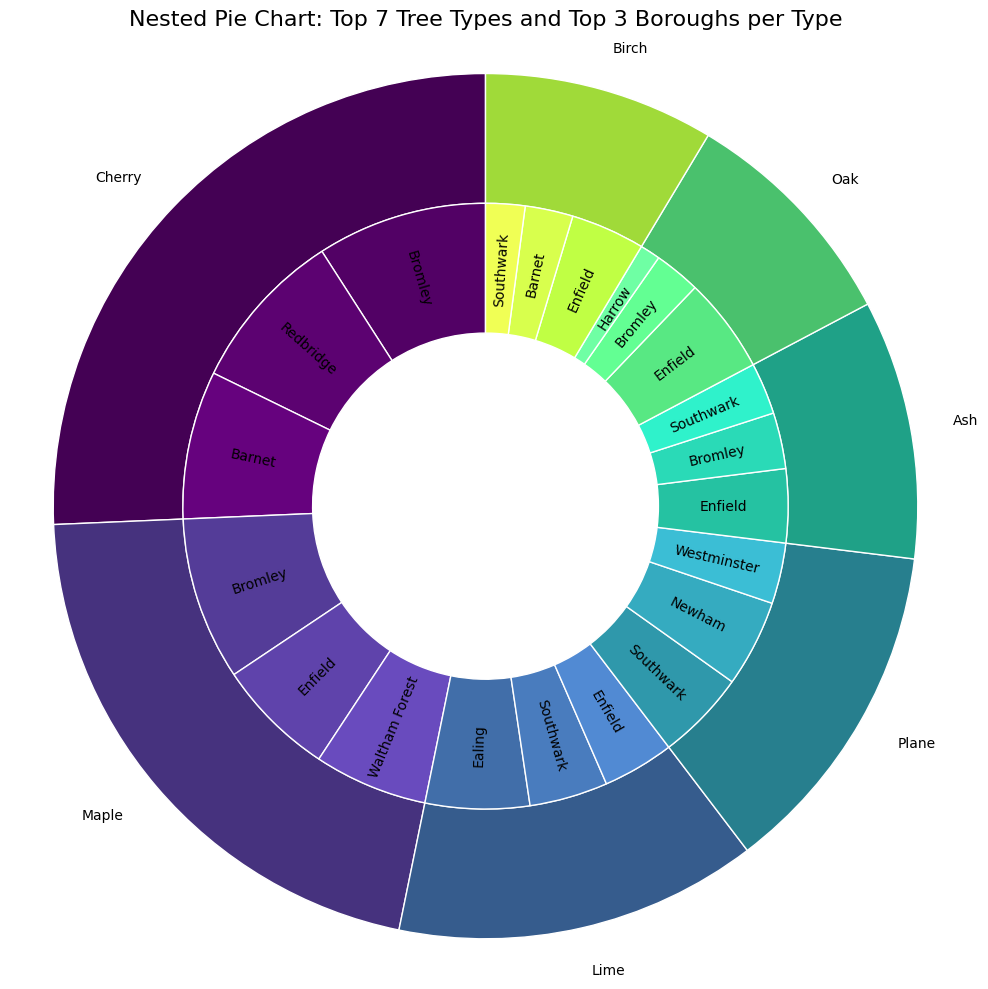

In [76]:
# Nested pie chart to see top 7 trees and their top 3 boroughs 

# Step 1: Count the total number of trees per type
total_tree_type_counts_nested = df_cleaned[df_cleaned['gla_tree_name'] != 'Other']['gla_tree_name'].value_counts()

# Step 2: Select the top 7 most common tree types (excluding "Other")
top_7_tree_types_nested = total_tree_type_counts_nested.index[:7]

# Initialize data structures to hold the inner and outer ring data
inner_labels = []  # For boroughs
outer_labels = []  # For tree types
inner_sizes = []  # Sizes for inner ring (borough counts)
outer_sizes = []  # Sizes for outer ring (total tree type counts)
tree_colors = []  # To store the tree colors for later use

# Step 3: Loop through each of the top 7 tree types and get the top 3 boroughs
for i, tree_type in enumerate(top_7_tree_types_nested):
    # Filter the dataset for the current tree type
    df_filtered_nested = df_cleaned[df_cleaned['gla_tree_name'] == tree_type]
    
    # Get the total count of the current tree type for the outer ring
    tree_type_total = df_filtered_nested.shape[0]
    outer_sizes.append(tree_type_total)
    outer_labels.append(tree_type)  # Only add tree type once to outer ring

    # Store a gradient color for each tree type
    cmap = plt.get_cmap('viridis')  # You can change this to any gradient color map
    tree_color = cmap(i / len(top_7_tree_types_nested))  # Assign a unique color from the gradient
    tree_colors.append(tree_color)
    
    # Get the top 3 boroughs for the current tree type
    top_3_boroughs_nested = df_filtered_nested['borough'].value_counts().head(3)
    
    # Add borough data to the inner ring
    inner_labels.extend(top_3_boroughs_nested.index)
    inner_sizes.extend(top_3_boroughs_nested.values)

# Step 4: Normalize inner_sizes to match the proportions of outer_sizes
# The inner sizes should add up to the corresponding outer slice size
normalized_inner_sizes = []
outer_start = 0
for outer_size in outer_sizes:
    # Get the corresponding slice for the inner pie (top 3 boroughs for each tree type)
    current_inner_sizes = inner_sizes[outer_start:outer_start + 3]
    inner_total = sum(current_inner_sizes)
    # Scale each inner slice to match the outer size proportionally
    normalized_inner_sizes.extend([s / inner_total * outer_size for s in current_inner_sizes])
    outer_start += 3

# Step 5: Assign lighter gradient colors for boroughs based on the tree's color

# Assign a lighter gradient color for each borough based on the corresponding tree's color
inner_colors = []
outer_start = 0
for i, tree_color in enumerate(tree_colors):
    # We will create lighter versions of the tree color for the boroughs by increasing the brightness
    borough_gradient = np.linspace(1.2, 1.5, 3)  # Make the colors lighter (above 1 makes it lighter)
    for shade in borough_gradient:
        # Ensure values don't go above 1 by using min() function
        inner_colors.append((min(shade * tree_color[0], 1), 
                             min(shade * tree_color[1], 1), 
                             min(shade * tree_color[2], 1), 
                             tree_color[3]))  # Keep the alpha channel the same

# Step 6: Create the nested pie chart (donut-style)

# Define colors for outer ring (tree types) using a gradient-like colormap (e.g., 'viridis')
outer_colors = tree_colors

# Create figure
fig, ax = plt.subplots(figsize=(10, 10))

# Create the outer ring (tree types) with a gradient color scheme
wedges_outer, _ = ax.pie(outer_sizes, labels=outer_labels, radius=1, colors=outer_colors,
                         wedgeprops=dict(width=0.3, edgecolor='w'), startangle=90)

# Create the inner ring (boroughs), using normalized sizes and lighter gradient borough colors
wedges_inner, _ = ax.pie(normalized_inner_sizes, labels=None, radius=0.7, colors=inner_colors,
                         wedgeprops=dict(width=0.3, edgecolor='w'), startangle=90)

# Step 7: Add borough labels inside inner slices

# Function to add vertical text labels inside slices with dynamic orientation
def add_labels_inside(wedges, labels, radius):
    for i, wedge in enumerate(wedges):
        ang = (wedge.theta2 - wedge.theta1) / 2. + wedge.theta1  # Get angle for the center of the slice
        x = np.cos(np.radians(ang)) * radius  # X position (polar to Cartesian conversion)
        y = np.sin(np.radians(ang)) * radius  # Y position

        # Normalize the angle to [-180, 180] degrees for visual alignment
        ang_normalized = (ang + 180) % 360 - 180

        # Right side logic (upright text but rotated slightly to fit the wedge)
        if -90 <= ang_normalized <= 90:
            rotation = ang_normalized  # Keep text upright but match the wedge's angle

        # Left side logic (flip the text for readability)
        else:
            rotation = ang_normalized + 180  # Flip text by 180 degrees

        # Place the text at calculated position with the appropriate rotation
        ax.text(x, y, labels[i], ha='center', va='center', rotation=rotation, rotation_mode='anchor', fontsize=10)

# Add the borough labels inside the inner slices
add_labels_inside(wedges_inner, inner_labels, radius=0.55)

# Add title
plt.title('Nested Pie Chart: Top 7 Tree Types and Top 3 Boroughs per Type', fontsize=16)

# Equal aspect ratio ensures that pie is drawn as a circle
plt.axis('equal')

# Show the plot
plt.tight_layout()
plt.show()

/var/folders/7q/gj7yd_s57z9bgskyy_d1112c0000gn/T/ipykernel_41000/2936564572.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=trees_per_borough.index, y=trees_per_borough.values, palette="viridis")


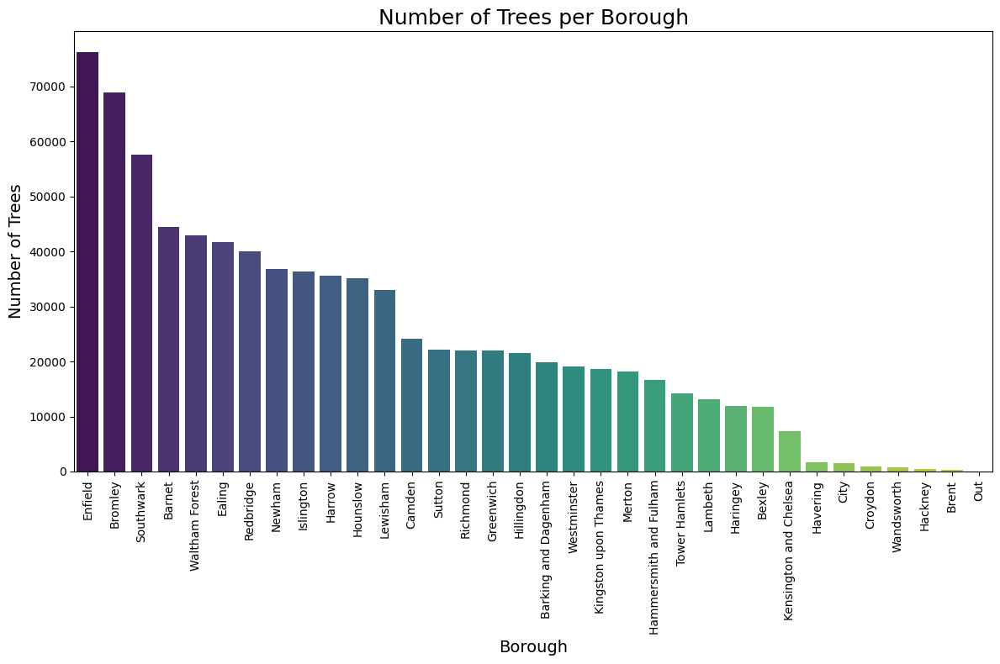

In [35]:
# Next is a bar chart for how many trees per borough

# Count the number of trees in each borough
trees_per_borough = df_cleaned['borough'].value_counts()

# Create a bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x=trees_per_borough.index, y=trees_per_borough.values, palette="viridis")

# Add titles and labels
plt.title('Number of Trees per Borough', fontsize=18)
plt.xlabel('Borough', fontsize=14)
plt.ylabel('Number of Trees', fontsize=14)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [ ]:
# Next one, lets look at the top 5 trees in each borough 


In [13]:
# Moving on to some more advanced visuals, I want to show the number of trees per borough on a heat map. First we need to group by borough
tree_counts_by_borough = df_cleaned.groupby('borough').agg({'objectid' : 'count'}).reset_index()
tree_counts_by_borough.head()

,borough,objectid
0,Barking and Dagenham,19923
1,Barnet,44457
2,Bexley,11700
3,Brent,261
4,Bromley,68932


In [14]:
# Attempt to troubleshoot the issue where the map wasn't seemingly linking the number of trees to the folium map (checking names are the same, making sure they're lower case etc.)

with open('data/london_boroughs.geojson') as f:
    london_geo = json.load(f)

# Map isn't linking the data from trees - checking for name consistency between two datasets
for feature in london_geo['features']:
    print(feature['properties']['name'])

# Clean the borough column 
df['borough'] = df['borough'].str.strip().str.lower()

# Clean the GeoJSON borough names in the same way (if needed)
for feature in london_geo['features']:
    feature['properties']['name'] = feature['properties']['name'].strip().lower()

Barking and Dagenham
Barnet
Bexley
Brent
Bromley
Camden
City of London
Croydon
Ealing
Enfield
Greenwich
Hackney
Hammersmith and Fulham
Haringey
Harrow
Havering
Hillingdon
Hounslow
Islington
Kensington and Chelsea
Kingston upon Thames
Lambeth
Lewisham
Merton
Newham
Redbridge
Richmond upon Thames
Southwark
Sutton
Tower Hamlets
Waltham Forest
Wandsworth
Westminster


In [15]:
# This is the bit that doesn't work, I was using a geojson file to get the boundaries of the boroughs and that works fine. I double checked the key_on bit as well and that's also fine

# Try out folium for the map but get the borough markers in first 
with open('data/london_boroughs.geojson') as f:
    london_geo = json.load(f)

# folium map centered on London
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

folium.Choropleth(
    geo_data = london_geo,
    name = 'choropleth',
    data = tree_counts_by_borough,
    columns = ['borough', 'objectid'],  # borough name and corresponding tree counts
    key_on = 'feature.properties.name', 
    fill_color = 'YlGnBu', 
    fill_opacity = 0.7,
    line_opacity = 0.5,
    threshold_scale=[0, 500, 800, 1300, 20000, 77000],  
    legend_name = 'Number of Trees per Borough'
).add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file and display
m.save('outputs/london_trees_heatmap.html')
m

In [16]:
# Using markers on the map instead to label each tree - not considering tree types, that's the next step. This works and doesn't use the geojson file. 

# Initialize the map
tree_map = folium.Map(location = [51.5074, -0.1278], zoom_start = 10)  

# Looping through the dataframe and plotting each tree
for index, row in sample_df.iterrows():
    folium.CircleMarker(
        location = [row['latitude'], row['longitude']],  
        radius = 2,  
        popup = f"Borough: {row['borough']}\nTree ID: {row['objectid']}",  
        color = 'green',
        fill = True,
        fill_color = 'blue'
    ).add_to(tree_map)

# Save or display the map
tree_map.save('outputs/london_tree_map.html')
tree_map


In [17]:
# Making a heatmap as an alternative to what I initially wanted to do with the borough boundary map 

tree_heatmap = folium.Map(location = [51.5074, -0.1278], zoom_start = 10)

# Create a list of latitude and longitude pairs for heatmap data - doing it the sleeker way 
heat_data = [[row['latitude'], row['longitude']] for index, row in sample_df.iterrows()]

# Add the heatmap layer
HeatMap(heat_data).add_to(tree_heatmap)

# Save or display the map
tree_heatmap.save('outputs/london_tree_heatmap.html')
tree_heatmap

In [18]:
# Let's see what Kepler can do 
map_kepler = KeplerGl(height=600)

# Add your data to the map
map_kepler.add_data(data=sample_df, name="London Trees")

# Display the map
map_kepler

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'London Trees': {'index': [377414, 387729, 372474, 671740, 565194, 512884, 217379, 369099, 7135…

In [19]:
# I want to make a visual that's 3D and per borough, need to find the ideal center of each borough 
# Next step is to make a dataframe of the geojson file and join it with my trees df - rename column to borough to make life easier later for the join

geo_data = gpd.read_file('data/london_boroughs.geojson')
geo_data = geo_data.rename(columns={'name': 'borough'})


# Check the geometry type of each feature first (I started by trying point and got a value error)
print(geo_data.geom_type)

0     Polygon
1     Polygon
2     Polygon
3     Polygon
4     Polygon
5     Polygon
6     Polygon
7     Polygon
8     Polygon
9     Polygon
10    Polygon
11    Polygon
12    Polygon
13    Polygon
14    Polygon
15    Polygon
16    Polygon
17    Polygon
18    Polygon
19    Polygon
20    Polygon
21    Polygon
22    Polygon
23    Polygon
24    Polygon
25    Polygon
26    Polygon
27    Polygon
28    Polygon
29    Polygon
30    Polygon
31    Polygon
32    Polygon
dtype: object


In [20]:
# # Calculate the centroid of each geometry (for polygons)
# geo_data['centroid'] = geo_data.centroid

# # Extract latitude and longitude from the centroid
# geo_data['borough_latitude'] = geo_data.centroid.y
# geo_data['borough_longitude'] = geo_data.centroid.x

# # Optionally, drop the centroid and geometry columns if no longer needed
# geo_data = geo_data.drop(columns=['centroid', 'geometry'])

In [21]:
#I get a warning above - the format in which the geomtries from which I am extracting centroids are not idea 
# I will revist this and try and fix it if necessary but first I want to see what it looks like as it is

In [22]:
# # Renaming the column for consistency for the join later and checking what it looks like
# geo_data = geo_data.rename(columns={'name': 'borough'})

# print(geo_data.head())

In [23]:
# # Let's join it to our trees data now 

# merged_df = pd.merge(sample_df, geo_data, on='borough', how='inner')

# # Check the result, which should include both tree-specific latitude/longitude and borough-specific latitude/longitude
# print(merged_df.head())

In [24]:
# # Making one more data frame that will just make it easier to use for the visual with only the things we need 
# tree_counts_by_borough_kepler = merged_df.groupby('borough').agg({
#     'objectid': 'count',  
#     'borough_latitude': 'mean',  
#     'borough_longitude': 'mean'  
# }).reset_index()

# # Rename for clarity
# tree_counts_by_borough_kepler.columns = ['borough', 'tree_count', 'latitude', 'longitude']

In [25]:
# # Let's try Kepler per borough now 
# # Initialize KeplerGl map object
# map_kepler_2 = KeplerGl(height=600)

# # Add your aggregated data to Kepler
# map_kepler_2.add_data(data=tree_counts_by_borough_kepler, name="Tree Count by Borough")

# # Display the map in Jupyter Notebook (if you're using one)
# map_kepler_2

In [26]:
# Attempt number 2
tree_counts_by_borough_kepler = sample_df.groupby('borough').agg({
    'objectid': 'count'  # Assuming 'objectid' is the unique identifier for each tree
}).reset_index()

# Rename the 'objectid' column to 'tree_count' for clarity
tree_counts_by_borough_kepler.columns = ['borough', 'tree_count']

# Step 4: Merge Tree Counts with the GeoJSON Borough Polygons
# Merge on 'borough' to attach the tree count data to the polygons
merged_geo = geo_data.merge(tree_counts_by_borough_kepler, on='borough', how='inner')

# Step 5: Load the Merged Data into Kepler.gl
# Initialize KeplerGl map object
map_kepler_2 = KeplerGl(height=600)

# Add the merged GeoDataFrame (with tree counts) to Kepler.gl
map_kepler_2.add_data(data=merged_geo, name="Tree Count by Borough (Polygons)")

# Display the map (if you're using a Jupyter Notebook)
map_kepler_2

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Tree Count by Borough (Polygons)': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14…